In [1]:
import os, glob
from io import BytesIO

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from PIL import Image

import nugraph as ng

try:
    from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
except Exception as e:
    EventAccumulator = None
    print("TensorBoard EventAccumulator import failed:", e)

torch.set_float32_matmul_precision("medium")

DATA_PATH = "/home/apaudel/NuGraph/scripts/merged1_Aug6_40k_pmtpmt_g4lepdir_with_vpred_nexusonly"
RUN_NAME = "merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5"
RUN_DIR = f"/home/apaudel/NuGraph/logs/{RUN_NAME}"

ckpts = glob.glob(f"{RUN_DIR}/**/*.ckpt", recursive=True)
assert ckpts, f"No checkpoint found under {RUN_DIR}"
CKPT = max(ckpts, key=os.path.getmtime)

event_files = sorted(glob.glob(f"{RUN_DIR}/**/events.out.tfevents.*", recursive=True))

print("DATA_PATH =", DATA_PATH)
print("RUN_NAME  =", RUN_NAME)
print("RUN_DIR   =", RUN_DIR)
print("CKPT      =", CKPT)
print("event files =", len(event_files))
for f in event_files:
    print(" ", f)

raw = torch.load(CKPT, map_location="cpu")
hp = raw.get("hyper_parameters", {})

print("\nCheckpoint hparams:")
for k in [
    "semantic_head", "vertex_head", "direction_head", "event_head",
    "sp_features", "use_optical", "use_pmt_pmt"
]:
    print(f"{k:16s} =", hp.get(k, "MISSING"))

Data = ng.data.H5DataModule
Model = ng.models.NuGraph3

nudata = Data(
    DATA_PATH,
    batch_size=64,
    num_workers=0,
    model=Model,
    shuffle="random",
    featext3d=True,
)

model = Model.load_from_checkpoint(CKPT)
model.eval()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

print("\nDataset lengths:")
print("train =", len(nudata.train_dataset))
print("val   =", len(nudata.val_dataset))
print("test  =", len(nudata.test_dataset))

print("\nModel sanity:")
print("use_optical =", model.use_optical)
print("PMT-PMT active =", model.optical_net.use_pmt_pmt if hasattr(model, "optical_net") else None)
print("sp_net active =", model.encoder.sp_net is not None)

DATA_PATH = /home/apaudel/NuGraph/scripts/merged1_Aug6_40k_pmtpmt_g4lepdir_with_vpred_nexusonly
RUN_NAME  = merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5
RUN_DIR   = /home/apaudel/NuGraph/logs/merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5
CKPT      = /home/apaudel/NuGraph/logs/merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5/version_0/checkpoints/epoch=99-step=47000.ckpt
event files = 1
  /home/apaudel/NuGraph/logs/merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5/version_0/events.out.tfevents.1787318896.jupyter-apaudel.4959.0

Checkpoint hparams:
semantic_head    = True
vertex_head      = True
direction_head   = True
event_head       = False
sp_features      = 5
use_optical      = True
use_pmt_pmt      = True

Da

========== Checking TensorBoard logs ==========

Reading TensorBoard file from: /home/apaudel/NuGraph/logs/merged1_Aug21_40k_g4lepdir_tpc_pds_semantic_vertex_direction_axisloss_fixedvpred_nexusfeat_pmtpmt_ep100_bs64_in8_sp5/version_0
Number of scalar tags: 66
Number of image tags: 2

Scalar tags containing loss/angle/cos/resolution/vertex:
  direction/angle-deg-median-train
  direction/angle-deg-median-val
  direction/angle-deg-train
  direction/angle-deg-val
  direction/axis-angle-deg-median-train
  direction/axis-angle-deg-median-val
  direction/axis-angle-deg-train
  direction/axis-angle-deg-val
  direction/axis-cosine-train
  direction/axis-cosine-val
  direction/axis-ux-resolution-train
  direction/axis-ux-resolution-val
  direction/axis-uy-resolution-train
  direction/axis-uy-resolution-val
  direction/axis-uz-resolution-train
  direction/axis-uz-resolution-val
  direction/cosine-train
  direction/cosine-val
  direction/loss-cosine-train
  direction/loss-cosine-val
  direction/lo

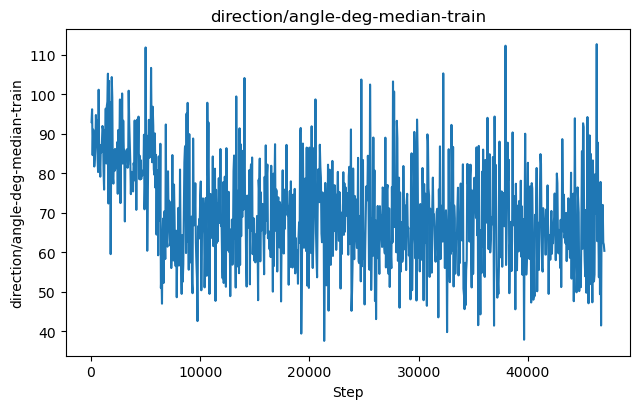

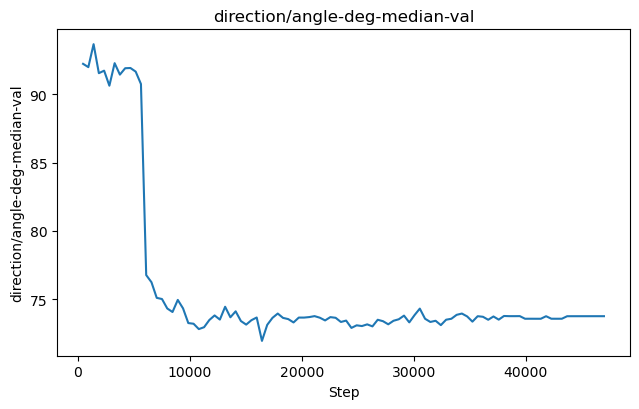

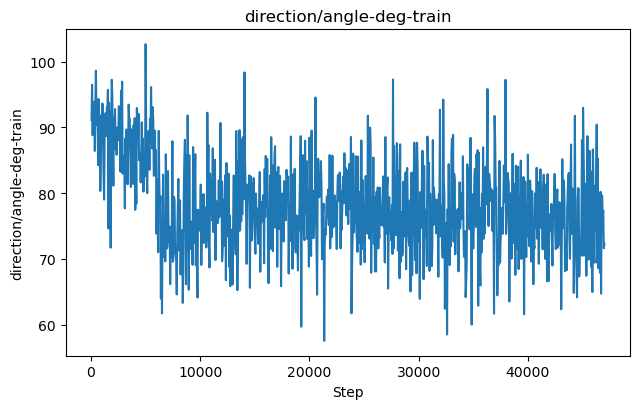

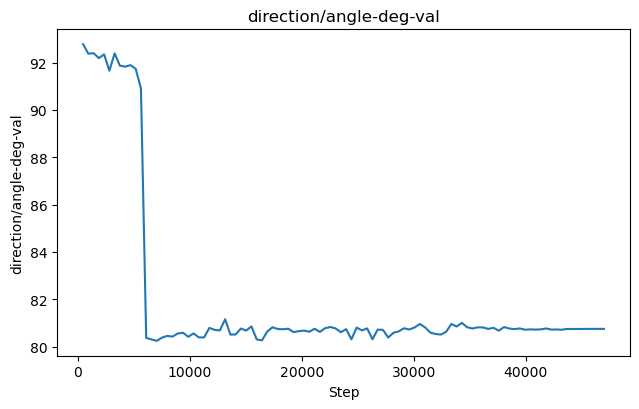

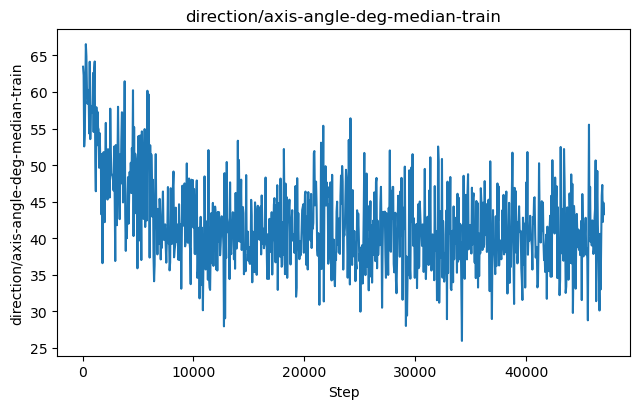

...

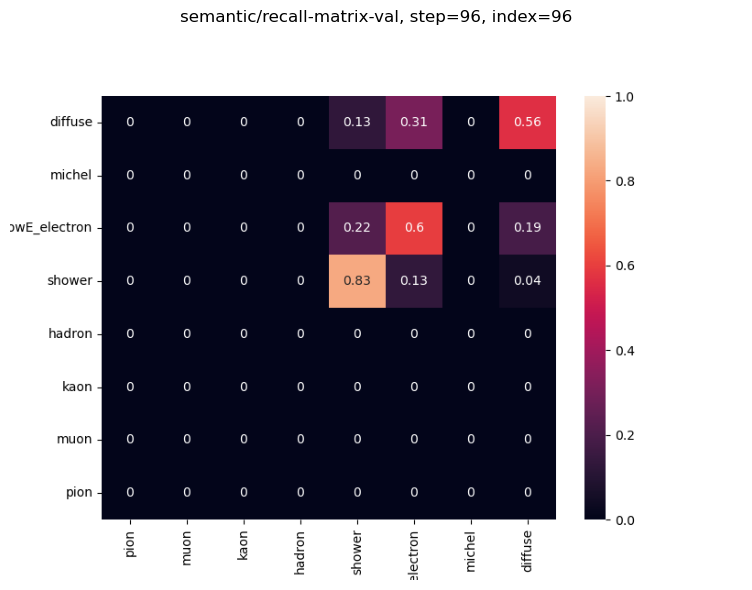

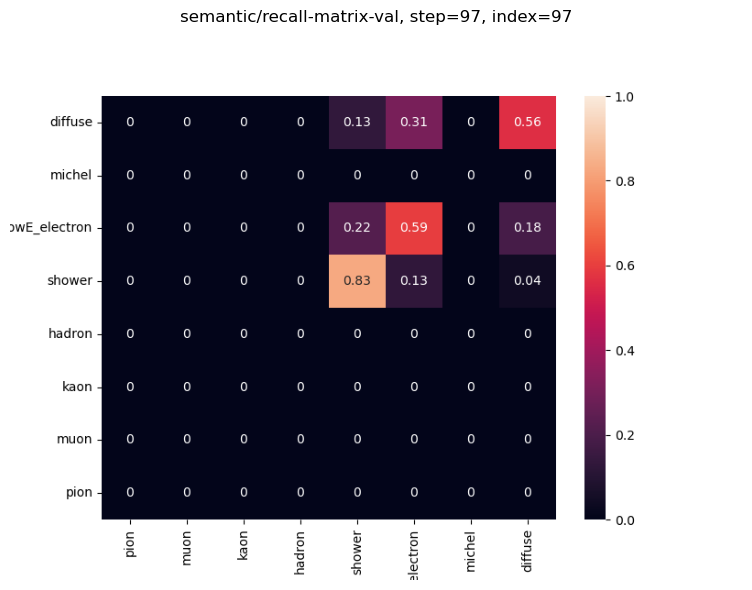

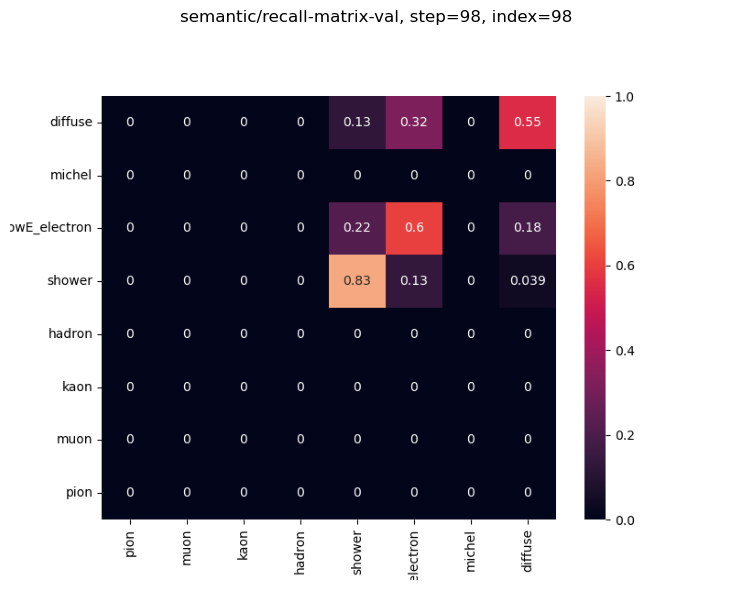

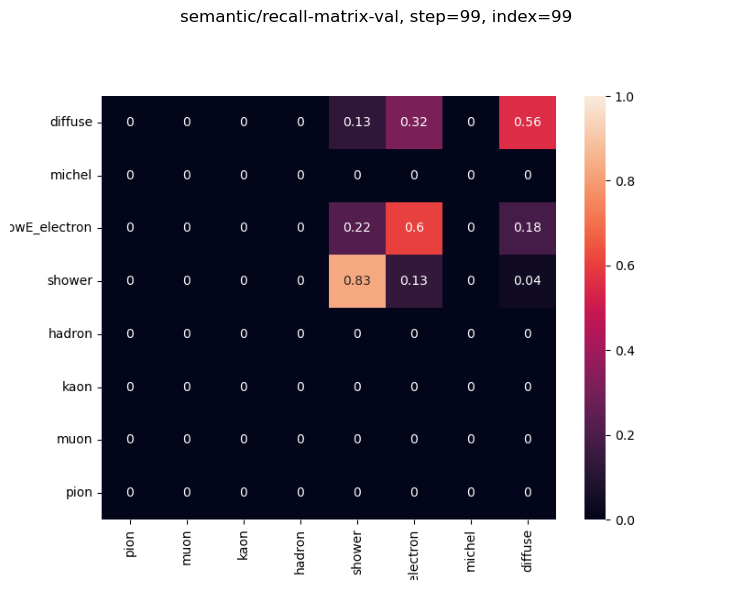

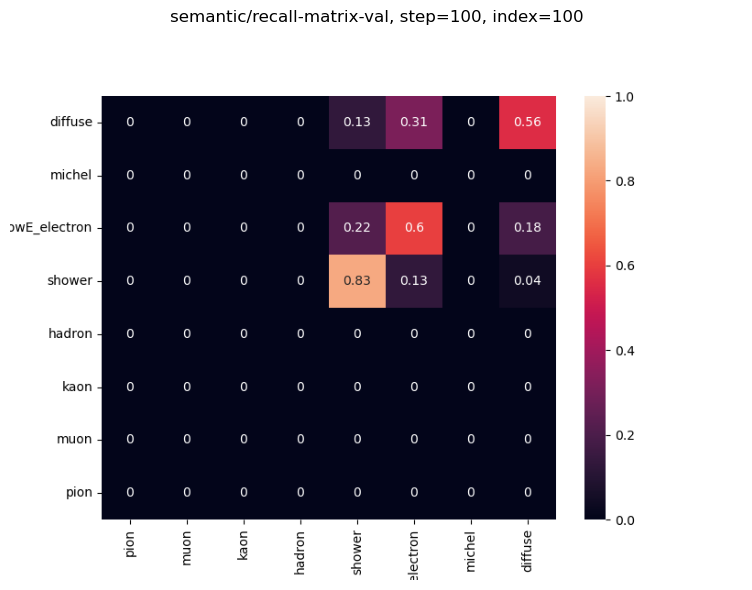

,N test,median residual axis angle deg,mean residual axis angle deg,p68 residual axis angle deg,p90 residual axis angle deg,axis cos mean,axis cos median,frac axis angle < 10 deg,frac axis angle < 20 deg,frac axis angle < 30 deg,...,median |Δuy|,median |Δuz|,pred vertex median err cm,pred vertex mean err cm,pred vertex p68 err cm,pred vertex p90 err cm,fixed v_pred median err cm,fixed v_pred mean err cm,fixed v_pred p68 err cm,fixed v_pred p90 err cm
0,1672,41.475201,43.748901,56.186001,79.231102,0.6621,0.7492,0.0634,0.2028,0.3487,...,0.2695,0.2949,185.049896,185.465698,249.478302,331.638,5.4797,8.3818,8.1207,17.76



Median residual angle estimate:
  median axis residual angle = 41.48 deg
  p68 axis residual angle    = 56.19 deg
  p90 axis residual angle    = 79.23 deg

Median vertex residual estimate:
  current model evt.v median residual = 185.05 cm
  fixed evt.v_pred median residual    = 5.48 cm


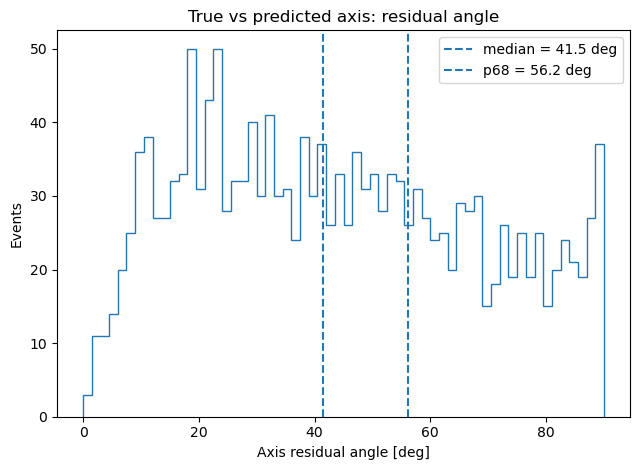

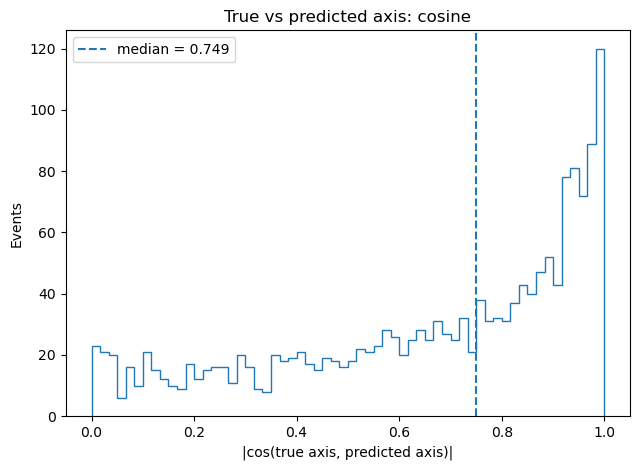

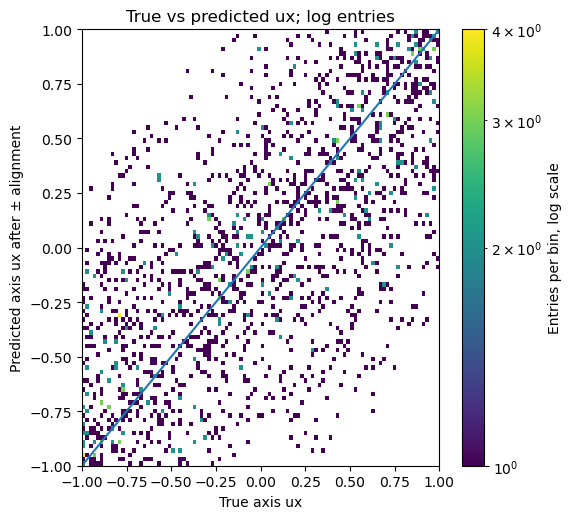

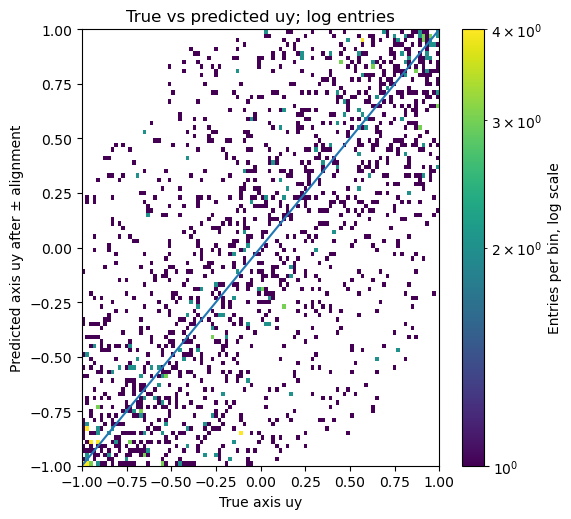

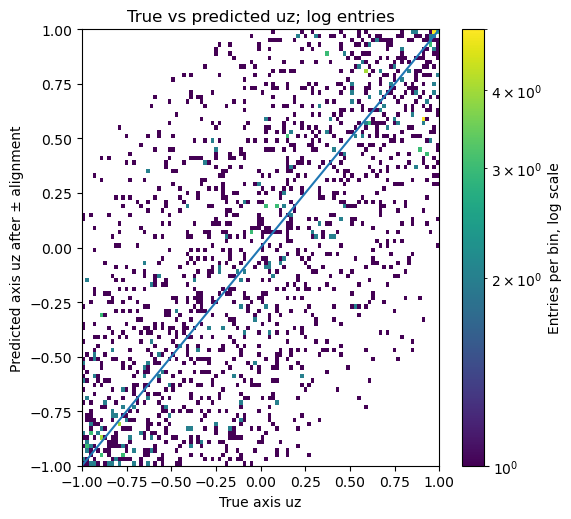

...

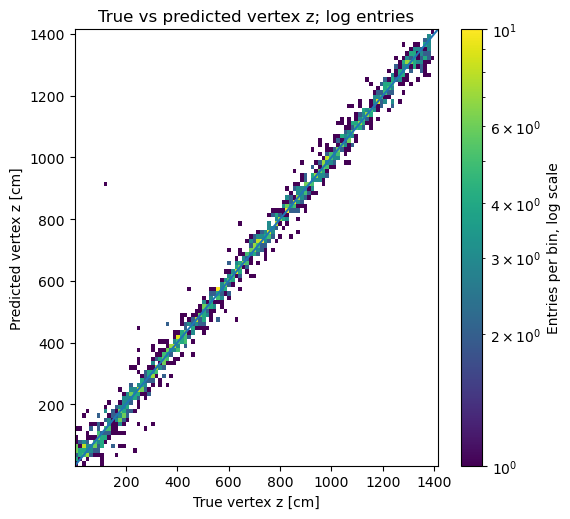

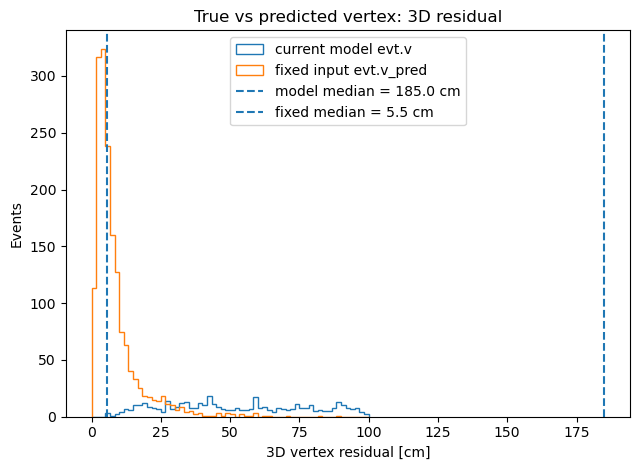

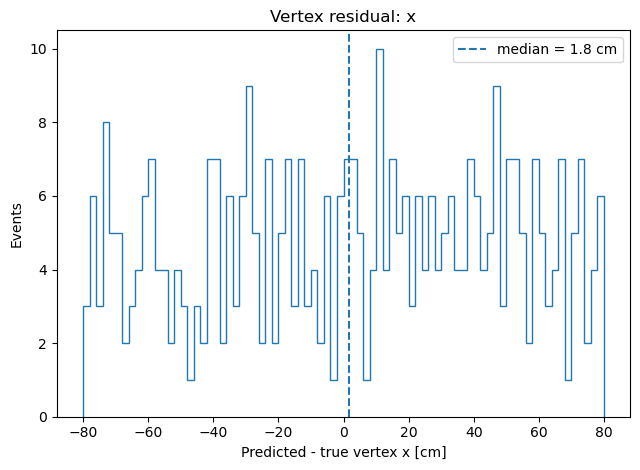

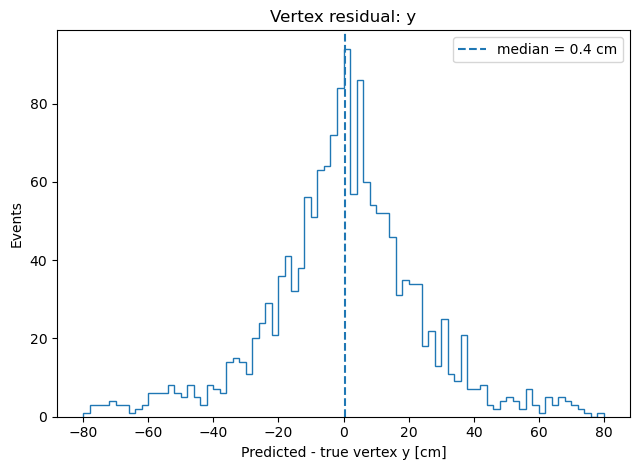

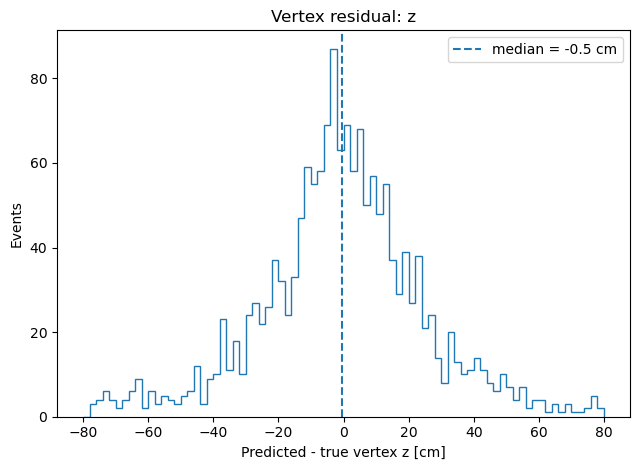

In [2]:
# ============================================================
# 0. Check TensorBoard logs for this run
# ============================================================

print("========== Checking TensorBoard logs ==========")

if EventAccumulator is not None and event_files:
    for ef in event_files:
        version_dir = os.path.dirname(ef)
        print("\nReading TensorBoard file from:", version_dir)

        acc = EventAccumulator(version_dir, size_guidance={"scalars": 0, "images": 0})
        acc.Reload()

        scalar_tags = sorted(acc.Tags().get("scalars", []))
        image_tags = sorted(acc.Tags().get("images", []))

        print("Number of scalar tags:", len(scalar_tags))
        print("Number of image tags:", len(image_tags))

        important_tags = [
            t for t in scalar_tags
            if any(s in t.lower() for s in ["loss", "angle", "cos", "resolution", "vertex"])
        ]

        print("\nScalar tags containing loss/angle/cos/resolution/vertex:")
        for t in important_tags:
            print(" ", t)

        print("\nImage tags:")
        for t in image_tags:
            print(" ", t)

        for tag in important_tags:
            evs = acc.Scalars(tag)
            steps = np.array([e.step for e in evs])
            vals = np.array([e.value for e in evs])

            plt.figure(figsize=(6.5, 4.2))
            plt.plot(steps, vals)
            plt.xlabel("Step")
            plt.ylabel(tag)
            plt.title(tag)
            plt.tight_layout()
            plt.show()

        for tag in image_tags:
            imgs = acc.Images(tag)
            for i, im in enumerate(imgs):
                img = Image.open(BytesIO(im.encoded_image_string))
                plt.figure(figsize=(8, 6))
                plt.imshow(img)
                plt.axis("off")
                plt.title(f"{tag}, step={im.step}, index={i}")
                plt.tight_layout()
                plt.show()
else:
    print("No readable TensorBoard event files.")


# ============================================================
# 1. Evaluate model on test set
# ============================================================

rows = []

with torch.no_grad():
    for batch in nudata.test_dataloader():
        batch = batch.to(device)
        model(batch, "test")

        evt = batch["evt"]

        rows.append({
            "true_dir": evt.y_dir.detach().float().cpu().numpy(),
            "pred_dir": evt.d.detach().float().cpu().numpy(),

            "true_vtx": evt.y_vtx.detach().float().cpu().numpy(),
            "pred_vtx": evt.v.detach().float().cpu().numpy(),

            # fixed predicted vertex stored in graph, used as direction reference
            "fixed_vpred": evt.v_pred.detach().float().cpu().numpy(),
        })

true_dir = np.concatenate([r["true_dir"] for r in rows], axis=0)
pred_dir = np.concatenate([r["pred_dir"] for r in rows], axis=0)

true_vtx = np.concatenate([r["true_vtx"] for r in rows], axis=0)
pred_vtx = np.concatenate([r["pred_vtx"] for r in rows], axis=0)
fixed_vpred = np.concatenate([r["fixed_vpred"] for r in rows], axis=0)

def unit(x):
    n = np.linalg.norm(x, axis=1, keepdims=True)
    return x / np.clip(n, 1.0e-12, None)

true_axis = unit(true_dir)
pred_axis = unit(pred_dir)

# Axis comparison: u and -u are equivalent.
cos_signed = np.sum(true_axis * pred_axis, axis=1)
cos_signed = np.clip(cos_signed, -1.0, 1.0)

axis_cos = np.abs(cos_signed)
axis_angle_deg = np.degrees(np.arccos(axis_cos))

# Global sign alignment for component comparison.
axis_sign = np.where(cos_signed >= 0.0, 1.0, -1.0)[:, None]
pred_axis_aligned = pred_axis * axis_sign

axis_residual_vec = pred_axis_aligned - true_axis
axis_component_abs = np.abs(axis_residual_vec)

pred_vtx_residual = pred_vtx - true_vtx
pred_vtx_err = np.linalg.norm(pred_vtx_residual, axis=1)

fixed_vpred_residual = fixed_vpred - true_vtx
fixed_vpred_err = np.linalg.norm(fixed_vpred_residual, axis=1)


# ============================================================
# 2. Summary table
# ============================================================

summary = {
    "N test": len(axis_angle_deg),

    "median residual axis angle deg": np.median(axis_angle_deg),
    "mean residual axis angle deg": np.mean(axis_angle_deg),
    "p68 residual axis angle deg": np.percentile(axis_angle_deg, 68),
    "p90 residual axis angle deg": np.percentile(axis_angle_deg, 90),

    "axis cos mean": np.mean(axis_cos),
    "axis cos median": np.median(axis_cos),

    "frac axis angle < 10 deg": np.mean(axis_angle_deg < 10),
    "frac axis angle < 20 deg": np.mean(axis_angle_deg < 20),
    "frac axis angle < 30 deg": np.mean(axis_angle_deg < 30),

    "median |Δux|": np.median(axis_component_abs[:, 0]),
    "median |Δuy|": np.median(axis_component_abs[:, 1]),
    "median |Δuz|": np.median(axis_component_abs[:, 2]),

    "pred vertex median err cm": np.median(pred_vtx_err),
    "pred vertex mean err cm": np.mean(pred_vtx_err),
    "pred vertex p68 err cm": np.percentile(pred_vtx_err, 68),
    "pred vertex p90 err cm": np.percentile(pred_vtx_err, 90),

    "fixed v_pred median err cm": np.median(fixed_vpred_err),
    "fixed v_pred mean err cm": np.mean(fixed_vpred_err),
    "fixed v_pred p68 err cm": np.percentile(fixed_vpred_err, 68),
    "fixed v_pred p90 err cm": np.percentile(fixed_vpred_err, 90),
}

display(pd.DataFrame([summary]).round(4))

print("\nMedian residual angle estimate:")
print(f"  median axis residual angle = {np.median(axis_angle_deg):.2f} deg")
print(f"  p68 axis residual angle    = {np.percentile(axis_angle_deg, 68):.2f} deg")
print(f"  p90 axis residual angle    = {np.percentile(axis_angle_deg, 90):.2f} deg")

print("\nMedian vertex residual estimate:")
print(f"  current model evt.v median residual = {np.median(pred_vtx_err):.2f} cm")
print(f"  fixed evt.v_pred median residual    = {np.median(fixed_vpred_err):.2f} cm")


# ============================================================
# 3. Residual axis angle plots
# ============================================================

plt.figure(figsize=(6.5, 4.8))
plt.hist(axis_angle_deg, bins=60, range=(0, 90), histtype="step")
plt.axvline(np.median(axis_angle_deg), linestyle="--", label=f"median = {np.median(axis_angle_deg):.1f} deg")
plt.axvline(np.percentile(axis_angle_deg, 68), linestyle="--", label=f"p68 = {np.percentile(axis_angle_deg, 68):.1f} deg")
plt.xlabel("Axis residual angle [deg]")
plt.ylabel("Events")
plt.title("True vs predicted axis: residual angle")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(6.5, 4.8))
plt.hist(axis_cos, bins=60, range=(0, 1), histtype="step")
plt.axvline(np.median(axis_cos), linestyle="--", label=f"median = {np.median(axis_cos):.3f}")
plt.xlabel("|cos(true axis, predicted axis)|")
plt.ylabel("Events")
plt.title("True vs predicted axis: cosine")
plt.legend()
plt.tight_layout()
plt.show()


# ============================================================
# 4. ux, uy, uz true vs predicted with log z/color axis
# ============================================================

# x and y axes are linear.
# z axis = event count per bin, shown with logarithmic color normalization.

for coord, label in [(0, "x"), (1, "y"), (2, "z")]:
    plt.figure(figsize=(5.8, 5.3))

    h = plt.hist2d(
        true_axis[:, coord],
        pred_axis_aligned[:, coord],
        bins=100,
        range=[[-1, 1], [-1, 1]],
        norm=LogNorm(),
    )

    plt.plot([-1, 1], [-1, 1], linewidth=1.5)
    plt.xlabel(f"True axis u{label}")
    plt.ylabel(f"Predicted axis u{label} after ± alignment")
    plt.title(f"True vs predicted u{label}; log entries")
    cbar = plt.colorbar()
    cbar.set_label("Entries per bin, log scale")
    plt.tight_layout()
    plt.show()


# ============================================================
# 5. Vertex true vs predicted with log z/color axis
# ============================================================

for coord, label in [(0, "x"), (1, "y"), (2, "z")]:
    lo = min(true_vtx[:, coord].min(), pred_vtx[:, coord].min())
    hi = max(true_vtx[:, coord].max(), pred_vtx[:, coord].max())

    plt.figure(figsize=(5.8, 5.3))

    plt.hist2d(
        true_vtx[:, coord],
        pred_vtx[:, coord],
        bins=100,
        range=[[lo, hi], [lo, hi]],
        norm=LogNorm(),
    )

    plt.plot([lo, hi], [lo, hi], linewidth=1.5)
    plt.xlabel(f"True vertex {label} [cm]")
    plt.ylabel(f"Predicted vertex {label} [cm]")
    plt.title(f"True vs predicted vertex {label}; log entries")
    cbar = plt.colorbar()
    cbar.set_label("Entries per bin, log scale")
    plt.tight_layout()
    plt.show()


# ============================================================
# 6. Vertex residual plots
# ============================================================

plt.figure(figsize=(6.5, 4.8))
plt.hist(pred_vtx_err, bins=60, range=(0, 100), histtype="step", label="current model evt.v")
plt.hist(fixed_vpred_err, bins=60, range=(0, 100), histtype="step", label="fixed input evt.v_pred")
plt.axvline(np.median(pred_vtx_err), linestyle="--", label=f"model median = {np.median(pred_vtx_err):.1f} cm")
plt.axvline(np.median(fixed_vpred_err), linestyle="--", label=f"fixed median = {np.median(fixed_vpred_err):.1f} cm")
plt.xlabel("3D vertex residual [cm]")
plt.ylabel("Events")
plt.title("True vs predicted vertex: 3D residual")
plt.legend()
plt.tight_layout()
plt.show()

for coord, label in [(0, "x"), (1, "y"), (2, "z")]:
    residual = pred_vtx_residual[:, coord]

    plt.figure(figsize=(6.5, 4.8))
    plt.hist(residual, bins=80, range=(-80, 80), histtype="step")
    plt.axvline(np.median(residual), linestyle="--", label=f"median = {np.median(residual):.1f} cm")
    plt.xlabel(f"Predicted - true vertex {label} [cm]")
    plt.ylabel("Events")
    plt.title(f"Vertex residual: {label}")
    plt.legend()
    plt.tight_layout()
    plt.show()